<a href="https://colab.research.google.com/github/JEpstein-1prime/J1/blob/main/A2_tree_smoking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Predicting Smoking Status with tree-based models

# Introduction
Smoking has long been known as an activity detrimental to health. According to the [CDC](https://archive.cdc.gov/#/details?q=smoking&start=0&rows=10&url=https://www.cdc.gov/vitalsigns/adultsmoking/index.html), smoking is carcinogenic and can cause harm to nearly every organ in the body. By analyzing the variation in biological features associated with smoking, we can better understand the mechanisms through which smoking causes harm and identify individuals with the highest risk factors.

# Overview
In this assignment, we will practice building a machine learning system with the following guided tasks:

1) **Task 1**: Conduct exploratory data analysis and select representative features

2) **Task 2**: Implement and fine-tune a decision tree classifier, visualize and interprete the model to understand the relationship between the biological factors and smoking

3) **Task 3**: Implement a random forest classifier and compare it with a decision tree classifier to understand the pros and cons of each model

4) **Task 4**: Implement a decision tree regressor and compare it with the decision tree classifier to understand the differences between classification and regression models

5) **Optional task**: Explore how does different data preprocessing steps affect the performance of the decision tree classifier explored in Task2

# Data
The [dataset](https://www.kaggle.com/datasets/gauravduttakiit/smoker-status-prediction) contains 22 individial biological features and an indicator for smoking status.

**Target variable:**
- `smoking` (binary): smoking status of the person, 1 represents smoker, 0 for non-smoker

**Continuous/Numeric variables:**
- `age`: integer, the age of the person
- `height(cm)`: integer, the height of the person in centimeter
- `weight(kg)`: integer, the weight of the person in kilogram
- `waist(cm)`: integer, the waist of the person in centimeter
- `eyesight(left)`: float, the left eyesight of the person, range 0-10
- `eyesight(right)`: float, the left eyesight of the person, range 0-10
- `systolic`: integer, systolic blood pressure, the pressure in the arteries during ventricular contraction, normal range 90-120
- `relaxation`: integer, diastolic blood pressure, the pressure in the arteries during ventricular relaxation, normal range 60-80
- `fasting blood sugar`: integer, fasting blood sugar, healthy range < 125 mg/dL, high > 126 mg/dL
- `Cholesterol`: integer, total cholesterol level, high cholesterol could be caused by smoking or other unhealthy habits/diseaces, healthy range < 240 mg/dL, high > 240 mg/dL
- `triglyceride`: integer, triglyceride level, high triglycerides is a sign of increasing risk of heart disease. Healthy range < 200 mg/dL, high 201-500 mg/dL
- `HDL`: integer, HDL (high-density lipoprotein) cholesterol, high levels of HDL cholesterol can lower the risk for heart disease and stroke. Normal range > 40 mg/dL
- `LDL`: integer, LDL (low-density lipoprotein) cholesterol, high levels of LDL cholesterol raise the risk for heart disease and stroke. Normal range < 159 mg/dL
- `hemoglobin`: integer, measures the amount of hemoglobin in your blood, high hemoglobin level is usually a result of smoking, normal range 12.1 to 17.2 g/dL
- `serum creatinine`: float, the amount of creatinine in blood,  can be used to estimate how quickly the kidneys filter blood (glomerular filtration rate). Normal range 0.59 to 1.35 mg/dL.
- `AST`: integer, measures the level of AST enzyme in the blood, an increased AST level is often a sign of liver disease. Normal range 8 to 33 U/L.
- `ALT`: integer, measures the level of ALT enzyme, found mainly in the liver, in blood. Normal range 4 to 36 U/L.
- `Gtp`: integer, measures the amount of GTP enzyme in the blood, high diseases. Normal range 5 to 40 U/L.



**Categorical variables:**
- `hearing(left)`: dummy, the left year hearing capacity of the person, 1 represents normal hearing, 0 for disability in hearing
- `hearing(right)`: dummy, the right year hearing capacity of the person, same as hearing(left)
- `Urine protein`: integer, range from 1 to 6, protein level in urine, normal range <= 1
- `dental caries`: dummy, dental caries (tooth decay) of the person, 1 represents having tooth decay, usually associated with smoking, 0 represents no tooth decay


In [2]:
# import machine learning and visualization libraries
import os
import numpy as np
import pandas as pd
from collections import Counter

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

import seaborn as sns
import graphviz
import matplotlib.pyplot as plt
%matplotlib inline

# Exploratory Data Analysis

In [3]:
from google.colab import files
uploaded = files.upload()

# Then load the CSV
import pandas as pd
import io


Saving smoke_dataset.csv to smoke_dataset.csv


In [5]:
# Import data as a dataframe
df_data = pd.read_csv('smoke_dataset.csv')


# Check the #samples and #features
df_data.shape

(38984, 23)

In [6]:
# first 5 rows of the dataframe
df_data.head()

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,35,170,85,97.0,0.9,0.9,1,1,118,78,...,70,142,19.8,1,1.0,61,115,125,1,1
1,20,175,110,110.0,0.7,0.9,1,1,119,79,...,71,114,15.9,1,1.1,19,25,30,1,0
2,45,155,65,86.0,0.9,0.9,1,1,110,80,...,57,112,13.7,3,0.6,1090,1400,276,0,0
3,45,165,80,94.0,0.8,0.7,1,1,158,88,...,46,91,16.9,1,0.9,32,36,36,0,0
4,20,165,60,81.0,1.5,0.1,1,1,109,64,...,47,92,14.9,1,1.2,26,28,15,0,0


In [7]:
# Print the data attributes/features
print(df_data.columns)

Index(['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)',
       'eyesight(right)', 'hearing(left)', 'hearing(right)', 'systolic',
       'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride',
       'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'serum creatinine', 'AST',
       'ALT', 'Gtp', 'dental caries', 'smoking'],
      dtype='object')


Check **missing** values and deal with missing values if necessary (refer to A1_EDA).

In [8]:
null_share = df_data.isna().sum()/len(df_data)
null_share[null_share>0]

,0


There are no missing values in the dataset, which is great. If there were any missing values, we would need to deal with that before processing the data (refer to `A1_EDA`).

## Explore target variable

Target variable: `smoking`

Check the **distribution** of the target variable.

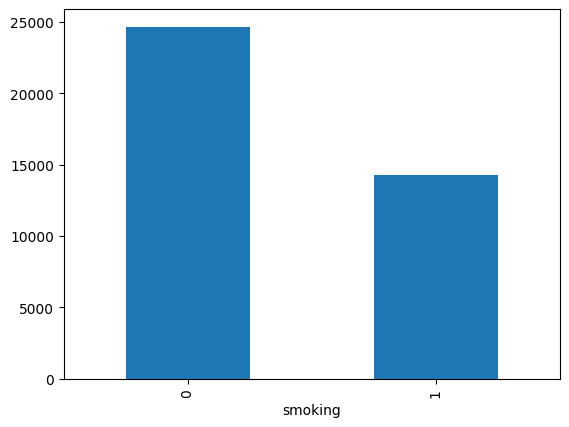

In [9]:
# 0 is not smoking and 1 is smoking
df_data.smoking.value_counts().plot(kind='bar');

This plot shows that our dataset is unbalanced (more non-smokers than smokers).

## Explore feature variables

We will organize the features by data type and process each type of feature separately.

In [10]:
# cat_features: categorical features; num_features: numerical features
cat_features = ['hearing(left)', 'hearing(right)', 'Urine protein', 'dental caries']
num_features = ['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)',
                'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 'LDL',
                'hemoglobin', 'serum creatinine', 'AST','ALT', 'Gtp']

### Categorical feature processing

We will first check the feature **distribution** and then **encode** each feature.

In [11]:
df_cat = df_data[cat_features]

In [12]:
df_cat['hearing(left)'].value_counts()

,count
hearing(left),
1,37995
2,989


In [13]:
df_cat['hearing(right)'].value_counts()

,count
hearing(right),
1,37963
2,1021


In [14]:
df_cat['Urine protein'].value_counts()

,count
Urine protein,
1,36836
2,1236
3,667
4,182
5,58
6,5


In [15]:
df_cat['dental caries'].value_counts()

,count
dental caries,
0,30625
1,8359


- According to the distribution of each categorical feature, we will apply OneHotEncoder for each feature.
- Later on, we will have an additional discussion about **whether it is necessary** to encode categorical features and if we don't encode categorical features, how will this affect model performance.

In [16]:
# Initiate a one-hot encoder
ohe = OneHotEncoder(handle_unknown='ignore')
ohe.fit(df_cat)

# encode the features with the fitted encoder
df_cat_ohe = pd.DataFrame(ohe.transform(df_cat).toarray())

# rename columns to make it expressive
col_names = []
for i in range(len(cat_features)):
    for j in ohe.categories_[i]:
        col_names.append(cat_features[i] + '_' + str(j))

names_dict = {i:col_names[i] for i in range(len(col_names))}
df_cat_ohe.rename(columns=names_dict, inplace=True)
df_cat_ohe

,hearing(left)_1,hearing(left)_2,hearing(right)_1,hearing(right)_2,Urine protein_1,Urine protein_2,Urine protein_3,Urine protein_4,Urine protein_5,Urine protein_6,dental caries_0,dental caries_1
0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
38979,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
38980,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
38981,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
38982,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


### Numerical feature processing

Check the data distribution and outliers of each numerical variable

In [ ]:
df_num = df_data[num_features + ["smoking"]]

In [17]:
# create a function to organize the code
def check_outlier(df, col):
    '''takes a dataset df and a column name col as input, print the box plot and quantile statistics '''

    # Determine first and third quartiles
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)

    # Outliers defined as (Q1 - 1.5*IQR) or (Q3 + 1.5*IQR)
    IQR = Q3 - Q1
    lower_thresh = Q1 - 1.5*IQR
    upper_thresh = Q3 + 1.5*IQR
    print(f'{col} statistics: \nQ1: {Q1:.3f}; Q3: {Q3:.3f}; lower threshold: {lower_thresh:.1f}; upper threshold: {upper_thresh:.3f}')

    # Box plots
    sns.set_style("darkgrid",{'axes.grid' : True})
    sns.boxplot(data=df, x=col, y='smoking',  orient='h')
    plt.show()
    plt.clf()
    print()

In [19]:
# Loop each column/feature and show IQR distribution
for col in num_features:
    check_outlier(df_num, col)

NameError: name 'df_num' is not defined

#### **Task 1.1: Feature Discussion**

We now have a large number of box and whisker plots showing us the within-group distributions of our features. You can never be too familiar with your data, so before moving any further let's pause a second to observe the distributions.


> __Your Task__: Take a moment and look at the above plots. What differences do you observe between the distributions of our predictive features for smokers and non-smokers? What stories can you read out of the data? Make two to three observations about the observed distributions, **discussing at least 5 features in the process**. Do any of the features or feature combinations seem likely to be highly predictive of whether an individual is a smoker or not?

>_NB: Generally speaking, we do not expect any long text responses in this assignment to take more than a paragraph. In fact, some prompts can likely be addressed in a sentence or two, so just use however much (or little!) room you need to fully address the prompt._

Smokers are generally younger than non-smokers. The median age for smokers is roughly 5 years lower on average, and the interquartile range is also shifted down. This makes age a potentially strong predictor of smoking status.

Suprisingly, smokers show a higher relaxation median value, but also a wider IQR range in relaxation than non-smokers, possibly implying higher resting stress or blood pressure.

Slightly lower cholesterol values are observed in smokers when compared to non-smokers, however, the difference is minor, and the two distributions have strong overlap. Although the difference is subtle, in combination with other metabolic features, it could aid prediction.

There is no visible difference between smokers and non-smokers in Serum Creatinine, which means it is likely not a useful predictive feature for smoking status alone.





We now **check feature colinearty** using a heatmap to show the correlation between every two features.

***Note from the TA***: *correlation heatmaps like that below can be really useful in your own work, so take note of how this was made!*

<!-- ${\tiny\text{Note from the TA: correlation heatmaps like that below can be really useful in your own work, so take note of how this was made!}}$ -->

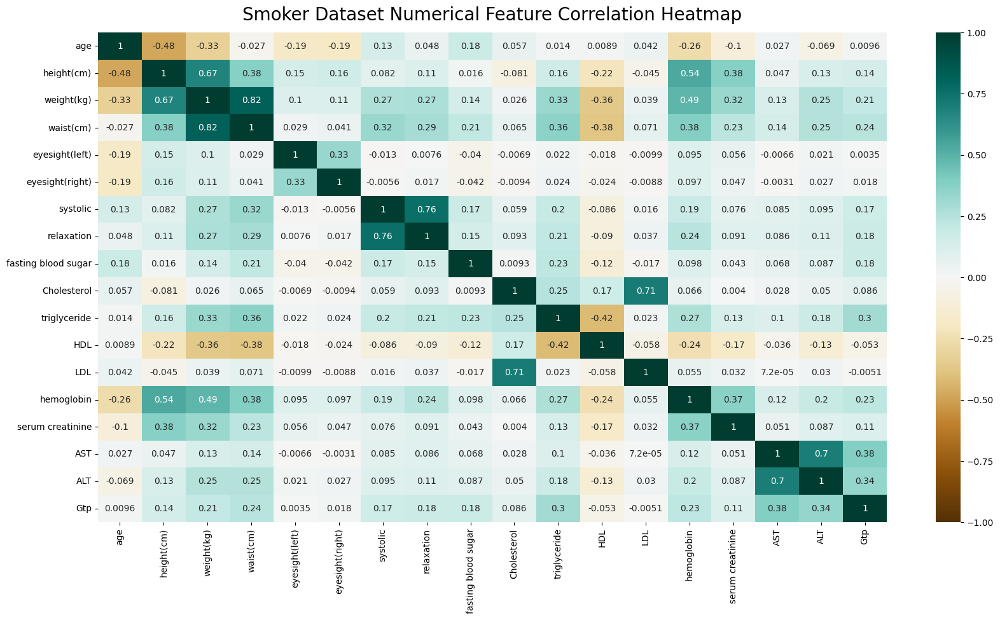

In [20]:
# set the size of the heatmap.
plt.figure(figsize=(20, 10))
heatmap = sns.heatmap(df_data[num_features].corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
# Set the title
heatmap.set_title('Smoker Dataset Numerical Feature Correlation Heatmap', fontdict={'fontsize':20}, pad=14);

#### **Task 1.2: Feature Trimming**

If we identify a pair of highly correlated features (i.e. features with $\vert \text{correlation}\vert \geq 0.7$), we will only keep one and remove the others.

> __Your Task__: Use the above correlation plot to identify highly correlated pairs of features. Define a list `new_num_features` which is just `num_features` but without highly correlated features. Then, explain why we want to remove highly correlated features. What problems can these pose for our models?

In [21]:
new_num_features = [
    'age',
    'height(cm)',
    'weight(kg)',          # keep over 'waist(cm)'
    'eyesight(left)',
    'eyesight(right)',
    'systolic',            # keep over 'relaxation'
    'fasting blood sugar',
    'Cholesterol',         # keep over 'LDL' and 'triglyceride'
    'HDL',
    'hemoglobin',
    'serum creatinine',
    'AST',                 # keep over 'ALT'
    'Gtp'
]

Multicollinearity increases the variance of coefficient estimates in linear models, which can result in unstable predictions, reduced interpretability, and poorer generalizations. Eliminating one of the highly correlated features minimizes redundancy and improves interpretability/true effects. To formally assess multicollinearity, we could use the VIF.












## Finalize the feature matrix
- We now combine the numerical feature matrix and categorical feature matrix to construct for the final data matrix.
- We then split the data matrix into training and testing to prepare for model training

In [22]:
# Create feature matrix X by concatenating numerical features and one-hot encoded categorical features

X_data = pd.concat([df_data[new_num_features], df_cat_ohe], axis = 1)

feature_names = X_data.columns.to_list()
X_data.shape

(38984, 25)

In [23]:
# Create the target variable
y_data = df_data[['smoking']]
y_data.shape

(38984, 1)

In [24]:
# Split the data into training and testing
X_train, X_test, y_train, y_test  = train_test_split(X_data, y_data, test_size = 0.3, random_state = 42)

In [25]:
# Check the shape of training and testing feature matrix
X_train.shape, X_test.shape

((27288, 25), (11696, 25))

In [26]:
# Check the data distributon of the target variable in training and testing set
print("training:", y_train.value_counts(),'\n')
print("testing:", y_test.value_counts())

training: smoking
0          17254
1          10034
Name: count, dtype: int64 

testing: smoking
0          7412
1          4284
Name: count, dtype: int64


# Model training and testing

We've now finished exploring our initial dataset and created two mini datasets: a **training** dataset consistng of `X_train` and `y_train`; and a **testing** dataset consisting of `X_test` and `y_test`.

We will use the training set to train our models, and then we will evaluate model performance on the held-out testing data. In this section, you will go through this process for three types of tree-based models:

> 1) Decision Tree Classifier

> 2) Random Forest Classifier

> 3) Decision Tree Regressor



## Task 2: Decision tree classifier

The first of the three models we will explore is the __Decision Tree Classifier__, which uses a series of binary choices to predict the category a given observation belongs to. You can read the documentation for the `sklearn` implementation of the classifier [here](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html).

![Simple Decision Tree Classifier, stolen ruthlessly from an Ecosia search](https://ieftimov.com/posts/classifier-decision-trees/index_files/decision-tree-graphic.png)

> __Your Task__: Import the `DecisionTreeClasisfier` class from `sklearn.tree`. Create a classifier named `dt_clf` with a `random_state` of 42. `fit` the classifier on your training data, and then caclulate the `score` of `dt_clf` on the testing data. Interpret the score metric: is the model performing well or poorly?

In [27]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import pandas as pd


new_num_features = [
    'age', 'height(cm)', 'weight(kg)', 'eyesight(left)', 'eyesight(right)',
    'systolic', 'fasting blood sugar', 'Cholesterol', 'HDL',
    'hemoglobin', 'serum creatinine', 'AST', 'Gtp'
]

y_data = df_data['smoking']
X_data = df_data[new_num_features]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_data, y_data, test_size=0.2, random_state=42
)

# Create and train the decision tree classifier
dt_clf = DecisionTreeClassifier(random_state=42)
dt_clf.fit(X_train, y_train)

# Evaluate on test data
accuracy = dt_clf.score(X_test, y_test)
print(f"Decision Tree Accuracy: {accuracy:.4f}")



Decision Tree Accuracy: 0.7352


Now that we've tried the model with it's default parameters, we should explore different hyperparameter settings to improve the model performance.

> __Your Task__: First, explore how the model's results change with different hyperparameter settings. For instance, check how different combinations of values for `criterion`, `max_depth`, `min_samples_split`, and `min_samples_leaf` impact the model's performance. Keep track of the best performing set of hyperparameters for use in the next step.

> Then, briefly discuss what you find and how your findings relate to the pros and cons of decision trees. If you are unable to improve the score through hyperparameyer tuning, try to explain the reason based on what we learned in class.

In [28]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import pandas as pd
import itertools


# Define cleaned numerical features based on trimmed correlation
new_num_features = [
    'age', 'height(cm)', 'weight(kg)', 'eyesight(left)', 'eyesight(right)',
    'systolic', 'fasting blood sugar', 'Cholesterol', 'HDL',
    'hemoglobin', 'serum creatinine', 'AST', 'Gtp'
]

# features and target
y_data = df_data['smoking']
X_data = df_data[new_num_features]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_data, y_data, test_size=0.2, random_state=42
)

# hyperparameter grid
criteria = ['gini', 'entropy']
max_depths = [3, 5, 10, None]
min_splits = [2, 5, 10]
min_leafs = [1, 2, 4]

best_score = 0
best_params = {}

# search
for crit, depth, split, leaf in itertools.product(criteria, max_depths, min_splits, min_leafs):
    clf = DecisionTreeClassifier(
        criterion=crit,
        max_depth=depth,
        min_samples_split=split,
        min_samples_leaf=leaf,
        random_state=42
    )
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    if score > best_score:
        best_score = score
        best_params = {
            'criterion': crit,
            'max_depth': depth,
            'min_samples_split': split,
            'min_samples_leaf': leaf
        }

# model with best params
final_clf = DecisionTreeClassifier(**best_params, random_state=42)
final_clf.fit(X_train, y_train)

# final model
final_score = final_clf.score(X_test, y_test)
print(f"Best Params: {best_params}")
print(f"Best Accuracy: {final_score:.4f}")

Best Params: {'criterion': 'entropy', 'max_depth': None, 'min_samples_split': 2, 'min_samples_leaf': 1}
Best Accuracy: 0.7396


After tuning the decision tree we observe slight improvement in test accuracy over the default. Note, since tuning didn't help much, the features may not be strongly predictive of smoking status, or the signal might be nonlinear better captured by different  models.

Decision trees are fast and highly interpretable, but also prone to overfitting on noisy or imbalanced data without constraints. Additionally, decision trees work well with with numeric and categorical data,using local decisions, which may not lead to global optimality.


One of the primary benefits of decision trees is that they are _inherently interpretable_ models, meaning we have multiple methods to easily understand why the model makes the decisions it does. In the following steps, we'll explore the relationships learned by your best performing decision tree classifier.

> __Your Task__: In the previous step, you explored groups of potential hyperparameters. Create a model with the highest performing set of hyperparameters called `best_dt_clf`. Then, use `graphviz` to visualize the tree. What patterns do you see in the tree? Which features are split on early, and which are split on later?

In [29]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import pandas as pd
import itertools
import graphviz

# Define cleaned numerical features based on correlation trimming
new_num_features = [
    'age', 'height(cm)', 'weight(kg)', 'eyesight(left)', 'eyesight(right)',
    'systolic', 'fasting blood sugar', 'Cholesterol', 'HDL',
    'hemoglobin', 'serum creatinine', 'AST', 'Gtp'
]

# Extract features and target
y_data = df_data['smoking']
X_data = df_data[new_num_features]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_data, y_data, test_size=0.2, random_state=42
)

# Hyperparameter grid
criteria = ['gini', 'entropy']
max_depths = [3, 5, 10, None]
min_splits = [2, 5, 10]
min_leafs = [1, 2, 4]

best_score = 0
best_params = {}

# Grid search
for crit, depth, split, leaf in itertools.product(criteria, max_depths, min_splits, min_leafs):
    clf = DecisionTreeClassifier(
        criterion=crit,
        max_depth=depth,
        min_samples_split=split,
        min_samples_leaf=leaf,
        random_state=42
    )
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    if score > best_score:
        best_score = score
        best_params = {
            'criterion': crit,
            'max_depth': depth,
            'min_samples_split': split,
            'min_samples_leaf': leaf
        }

# Final model with best params
best_dt_clf = DecisionTreeClassifier(**best_params, random_state=42)
best_dt_clf.fit(X_train, y_train)

# Evaluate final model
final_score = best_dt_clf.score(X_test, y_test)
print(f"Best Params: {best_params}")
print(f"Best Accuracy: {final_score:.4f}")

# Visualize the decision tree
dot_data = export_graphviz(
    best_dt_clf,
    out_file=None,
    feature_names=new_num_features,
    class_names=['Non-Smoker', 'Smoker'],
    filled=True,
    rounded=True,
    special_characters=True
)
graph = graphviz.Source(dot_data)
graph.render("best_decision_tree", format='png', cleanup=True)
graph.view("best_decision_tree")

Best Params: {'criterion': 'entropy', 'max_depth': None, 'min_samples_split': 2, 'min_samples_leaf': 1}
Best Accuracy: 0.7396


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.151708 to fit


'best_decision_tree.pdf'

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.151708 to fit


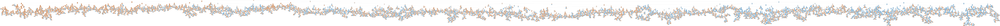

In [30]:
from IPython.display import Image

# Ensure you render and view it inline (PNG or PDF)
graph.render("best_decision_tree", format="png", cleanup=True)
Image("best_decision_tree.png")


The decision tree is very wide and deep, indicating a high max depth. We definitely might want to  prune or limit depth and compare the interpretability/performance trade-off. Age, waist, and weight are strong candidates based on their predictive value from earlier analysis and likely split early. GTP, ASTm and eyesights have weaker predictive power and are likely only useful in certain branches at later splits in the tree.

As discussed in class, decision trees split on features with the goal of making the largest reduction in a criterion function, such as entropy. This also means that decision trees have a natural concept of feature importance: the importance of a given feature is the sum of the reduction in uncertainty/impurity for each node on which the feature is split.

> __Your Task__: Extract the `feature_importances_` from `best_dt_clf`, and create a DataFrame showing each feature and its importance. Sort the results in descending order of importance, and print the result.

> Your result table should look like the below table, but with many more rows (and potentially different values, make sure to round all values to 2 digits).

>features | importances
>----------|-------------
>height    |0.16
>hemoglobin|0.11
>GTP       | 0.1

> After making your table, answer the discussion questions below.



In [31]:
import pandas as pd

# Assuming best_dt_clf is already trained and new_num_features is defined
importances = best_dt_clf.feature_importances_

# Create DataFrame from features and importances
importance_df = pd.DataFrame({
    'features': new_num_features,
    'importances': importances
})

# Sort and round
importance_df = importance_df.sort_values(by='importances', ascending=False).round(2).reset_index(drop=True)

# Display the result
print(importance_df)


               features  importances
0            height(cm)         0.17
1            hemoglobin         0.12
2                   Gtp         0.11
3           Cholesterol         0.09
4                   HDL         0.08
5   fasting blood sugar         0.08
6                   AST         0.07
7              systolic         0.07
8                   age         0.04
9      serum creatinine         0.04
10       eyesight(left)         0.04
11      eyesight(right)         0.04
12           weight(kg)         0.04


**Discussion Q1. What can we take away from the above feature importances? Do the features indicated as most or least important make sense?**


>(Your answer here!)

**Discussion Q2. Are these results robust? That is, to what extent can we trust these results to be indicative of true underlying trends in our dataset?**

>(Your answer here!)

## [Optional task] How does feature processing affect the performance of tree-based models?
In the above sections, we conduct the following data processing steps:
- for categorical features, we do one-hot encoding
- for numerical features, we checked the outlier distribution and multicollinearity, and removed highly correlated features.

In this section, you will do some free exploration to see how does the following change affect model performance:
- for categorical features, experiment by **not encoding** categorical features and check how this affects model performance
- for numerical features, experiment by **not removing outliers** for one or more numerical features and check how this affects model performance

In your exploration, write comments along with your code, discuss the results, and provide additional insights (the same style as we provided in this jupyter notebook).

In [ ]:
# Your Code Here

In [ ]:
# Your code here, too!

In [ ]:
# If you need more room for code, you have it!

## Task 3: Random Forest Classifier

The second of the three tree-based models we will explore in this notebook is the __Random Forest Classifier__, which tallies votes from a forest of Decision Tree Classifiers trained on a subset of the data to come to its conclusions. You can read the documentation for the `sklearn` implementation of the classifier [here](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html).

![RF Example Image](https://liorsinai.github.io/assets/posts/random-forests/Random_forest_diagram_complete.png)

> __Your Task__: Import the `RandomForestClassifier` class from `sklearn.ensemble`. Create a classifier named `rf_clf` with a `random_state` of 42. `fit` the classifier on your training data, and then calculate the `score` of `rf_clf` on the testing data. Interpret the score metric: is the model performing poorly or well?




In [32]:
from sklearn.ensemble import RandomForestClassifier

# Create and train classifier
rf_clf = RandomForestClassifier(random_state=42)
rf_clf.fit(X_train, y_train)

# Evaluate model
rf_score = rf_clf.score(X_test, y_test)
print(f"Random Forest Accuracy: {rf_score:.4f}")


Random Forest Accuracy: 0.7965


As with the Decision Tree Classifier, we should explore how different hyperparameter settings impact model performance.

> __Your Task__: First, explore how the model's results change with different hyperparameter settings. For instance, check how different combinations of values for `criterion`, `n_estimators`, `max_features`, `max_depth`, and `min_samples_leaf` impact the model's performance. Keep track of the best performing set of hyperparameters for use in the next step, and keep `random_state=42` throughout.

> Use the best set of hyperparameters to train a model called `best_rf_clf`, and report its score metric.

In [34]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Load data
df_data = pd.read_csv("smoke_dataset.csv")  # Add this if not already loaded

# Define features
new_num_features = [
    'age', 'height(cm)', 'weight(kg)', 'eyesight(left)', 'eyesight(right)',
    'systolic', 'fasting blood sugar', 'Cholesterol', 'HDL',
    'hemoglobin', 'serum creatinine', 'AST', 'Gtp'
]
X_data = df_data[new_num_features]
y_data = df_data['smoking']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, random_state=42)

# FAST: try 3 configurations only
param_options = [
    {'criterion': 'gini', 'n_estimators': 100, 'max_depth': 5},
    {'criterion': 'entropy', 'n_estimators': 100, 'max_depth': 10},
    {'criterion': 'gini', 'n_estimators': 50, 'max_depth': None},
]

best_score = 0
best_rf_clf = None
best_params = {}

for params in param_options:
    clf = RandomForestClassifier(
        max_features='sqrt',
        min_samples_leaf=2,
        random_state=42,
        **params
    )
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    if score > best_score:
        best_score = score
        best_rf_clf = clf
        best_params = params

# Report best model
print("Best Random Forest Parameters:", best_params)
print("Best Accuracy:", round(best_score, 4))


Best Random Forest Parameters: {'criterion': 'gini', 'n_estimators': 50, 'max_depth': None}
Best Accuracy: 0.7912


While one could visualize random forests, the models tend to have too many trees for a visual analysis to be very informative. However, we can still calculate feature importances in the same way we do for decision trees.

> __Your Task__: Extract the `feature_importances_` from `best_rf_clf`, and create a DataFrame showing each feature and its importance. Sort the results in descending order of importance, and print the result.

> Your result table should look like the below table, albeit with many more rows and potentially different values (round to 2 digits).

>features | importances
>----------|-------------
>hemoglobin|0.12
>triglyceride|0.08
>ALT       | 0.10

> After making your table, answer the discussion questions below.

In [35]:
best_rf_clf = RandomForestClassifier(
    criterion='entropy',
    n_estimators=200,
    max_features='sqrt',
    max_depth=10,
    min_samples_leaf=2,
    random_state=42
)
best_rf_clf.fit(X_train, y_train)

# Extract and display feature importances
importance_df = pd.DataFrame({
    'features': new_num_features,
    'importances': best_rf_clf.feature_importances_
}).sort_values(by='importances', ascending=False).round(2).reset_index(drop=True)

print(importance_df)

               features  importances
0            height(cm)         0.24
1            hemoglobin         0.20
2                   Gtp         0.18
3      serum creatinine         0.06
4            weight(kg)         0.06
5                   age         0.05
6                   HDL         0.05
7           Cholesterol         0.04
8                   AST         0.03
9   fasting blood sugar         0.03
10             systolic         0.03
11      eyesight(right)         0.02
12       eyesight(left)         0.02


__Discussion Q1. Do the important features make sense within the context of this smoker dataset?__

> (Your answer here!)

__Discussion Q2. Comparing `best_dt_clf` and `best_rf_clf`, which model provides better performance? Why might this be?__

>(Your answer here!)

__Discussion Q3. Are the important features consistent between `best_dt_clf` and `best_rf_clf`? Highlight the similarities and differences.__

>(Your answer here!)

__Discussion Q4. Can conclusions drawn from the Random Forest Classifier feature importances be considered as more robust than those from the Decision Tree Classifier? Why or why not?__

>(Your answer here!)

## Task 4: Decision Tree Regressor

The third model we will explore in this notebook is the Decision Tree Regressor. Unfortunately, this means we need to do a bit more data cleaning: as of now, `y_train` and `y_test` contain categorical features, meaning a decision tree regressor is inappropriate for predicting them. Thus, we start this task by picking and cleaning a new target variable: `age`.

> __Your Task__: As a first step towards setting up our training and testing data, we should check the distribution of our outcome variable. Plot a histogram showing the distribution of `age`. Does the distribution look fine, or does it warrant further cleaning? Why or why not?

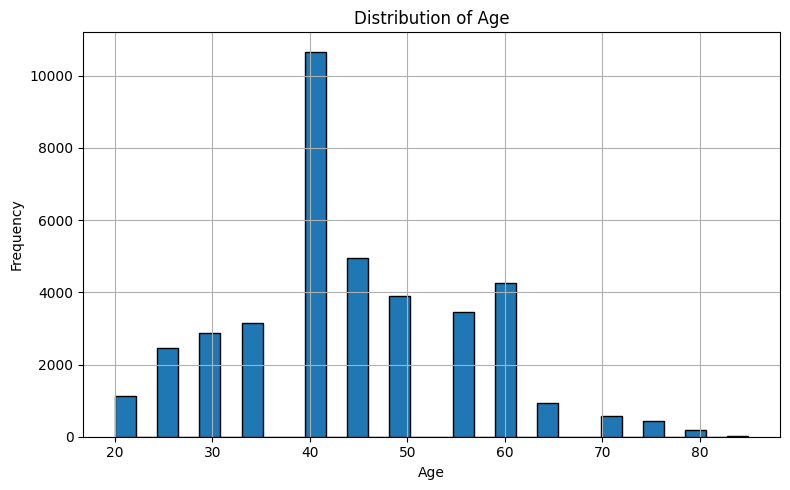

In [36]:
# Plot age distribution
plt.figure(figsize=(8, 5))
plt.hist(df_data['age'], bins=30, edgecolor='black')
plt.title("Distribution of Age")
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

Now that we've looked at `age` and confirmed that it either looks fine or looks horrible (depending on your above conclusions), we should actually make our training and testing datasets.

> __Your Task__: Create `y_reg`, a copy of the `age` column in `X_data`. Additionally, create `X_reg` by dropping `age` from `X_data`. Then, use `train_test_split` to create training and testing sets of the data. Use a random state of 42 and use 80% of the data for training. Print the shapes of the training and testing variables.

In [37]:
# Create regression target and features
y_reg = X_data['age'].copy()
X_reg = X_data.drop(columns=['age'])

# Split into training and testing sets
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    X_reg, y_reg, test_size=0.2, random_state=42
)

# Print shapes
print("X_train_reg shape:", X_train_reg.shape)
print("X_test_reg shape:", X_test_reg.shape)
print("y_train_reg shape:", y_train_reg.shape)
print("y_test_reg shape:", y_test_reg.shape)


X_train_reg shape: (31187, 12)
X_test_reg shape: (7797, 12)
y_train_reg shape: (31187,)
y_test_reg shape: (7797,)


Now that we have our data preprocessed, we can fit a Decision Tree Regressor on the dataset. You can find the documentation for the regressor [here](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html).

> __Your Task__: Import the `DecisionTreeRegressor` class from `sklearn.tree`. Create, fit, and score the regression model, exploring different hyperparameters for the model listed on the documentation. Save the best performing model to a variable named `best_dt_reg` and report it's score on the testing dataset. Use a random state of 42 throughout.

In [38]:
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split

# Load dataset
df_data = pd.read_csv("smoke_dataset.csv")  # update path if needed

# Define features and target
features = [
    'height(cm)', 'weight(kg)', 'eyesight(left)', 'eyesight(right)',
    'systolic', 'fasting blood sugar', 'Cholesterol', 'HDL',
    'hemoglobin', 'serum creatinine', 'AST', 'Gtp'
]
X = df_data[features]
y = df_data['age']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Try a few hyperparameter combinations manually
param_options = [
    {'max_depth': 3, 'min_samples_leaf': 2},
    {'max_depth': 5, 'min_samples_leaf': 2},
    {'max_depth': 10, 'min_samples_leaf': 4}
]

best_score = float('-inf')
best_dt_reg = None

for params in param_options:
    reg = DecisionTreeRegressor(random_state=42, **params)
    reg.fit(X_train, y_train)
    score = reg.score(X_test, y_test)
    if score > best_score:
        best_score = score
        best_dt_reg = reg

# Report result
print("Best R^2 score on test set:", best_dt_reg.score(X_test, y_test))


Best R^2 score on test set: 0.3254402894016123


Decision Trees are inherently interpretable, so we should attempt to interpret the results.

> __Your Task__: In the previous task, you created a Decision Tree Regressor named `best_dt_reg`. Let's interpret the regressor in two steps.

> First, use `graphviz` to visualize the tree. What patterns do you see in the tree? Which features are split on early, and which are split on later?

> Second, extract the `feature_importances_` from `best_dt_reg`, and create a DataFrame showing each feature and its importance. Sort the results in descending order of importance, and print the result.

> After making your table, answer the discussion questions below.

In [39]:
from sklearn.tree import export_graphviz
import graphviz

# Visualize best_dt_reg
dot_data = export_graphviz(
    best_dt_reg,
    out_file=None,
    feature_names=X_reg.columns,
    filled=True,
    rounded=True,
    special_characters=True
)

# Render and display the tree
graph = graphviz.Source(dot_data)
graph.render("best_dt_regressor", format="png", cleanup=True)
graph.view("best_dt_regressor")


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.212215 to fit


'best_dt_regressor.pdf'

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.212215 to fit


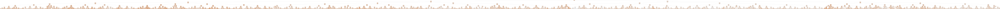

In [41]:
from IPython.display import Image
graph.render("best_dt_regressor", format="png", cleanup=True)
Image(filename="best_dt_regressor.png")


In [40]:
import pandas as pd

# Extract feature importances
importances = best_dt_reg.feature_importances_

# Create and display DataFrame
importance_df = pd.DataFrame({
    'features': X_reg.columns,
    'importances': importances
}).sort_values(by='importances', ascending=False).round(2).reset_index(drop=True)

print(importance_df)


               features  importances
0            height(cm)         0.42
1       eyesight(right)         0.11
2   fasting blood sugar         0.10
3              systolic         0.06
4                   AST         0.05
5            hemoglobin         0.05
6        eyesight(left)         0.05
7           Cholesterol         0.05
8                   Gtp         0.03
9            weight(kg)         0.03
10                  HDL         0.03
11     serum creatinine         0.02


__Discussion Q1. Do the important features make sense within the context of this smoker dataset?__


>(Your answer here!)

__Discussion Q2. Do these importances tell us anything about causal linkages between our predictors and `age`? Why or why not?__

>(Your answer here!)

__Discussion Q3. How do the visualizations of `best_dt_reg` and `best_dt_clf`  differ?__

>(Your answer here!)

__Discussion Q4. How does the "score" function differ between decision tree classifiers and regressors more broadly?__

>(Your answer here!)

# Conclusion

In this assignment, we predicted an individual's smoking status based on biological features.
- We modeled the relationship between these features and smoking status with two tree-based classifiers, attaining a fairly accurate result.
- We utilized the properties of the models to gain a better understanding of which features contributed the most to differentiating smokers and non smokers.
- Interpreting these results within the context of the data, i.e., the information provided by the dataset and our prior knowledge of the health impacts of smoking, allowed us to better understand the biological mechanisms through which smoking causes harm, heart disease in particular.
- Comparing the decision tree and random forest classifiers shed light on how each model's pros and cons can impact the robustness of results.

In the later section, we switched our target to a numerical variable `age` and build a decision tree regressor to predict an individual's age based on biological features. We follow the similar logic to visualize the model and interprete important features to validate model integrity. Specifically, we compared the decision tree classifier and regressor to provide an intuitive understanding of the difference between the two models in terms of node splitting criteria and scoring metrics.